$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [23]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

cpu
requirements: Ultralytics requirements ['pillow>=10.3.0', 'urllib3>=2.5.0 ; python_version > "3.8"'] not found, attempting AutoUpdate...


Using cache found in C:\Users\amita/.cache\torch\hub\ultralytics_yolov5_master


Retry 1/2 failed: Command 'pip install --no-cache-dir "pillow>=10.3.0" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.
Retry 2/2 failed: Command 'pip install --no-cache-dir "pillow>=10.3.0" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.
requirements:  Command 'pip install --no-cache-dir "pillow>=10.3.0" "urllib3>=2.5.0 ; python_version > "3.8"" ' returned non-zero exit status 2.


YOLOv5  2025-12-14 Python-3.8.12 torch-1.10.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


inference output img 1:
image 1/1: 183x275 2 persons, 1 surfboard
Speed: 5.5ms pre-process, 126.5ms inference, 1.0ms NMS per image at shape (1, 3, 448, 640)
         xmin       ymin        xmax        ymax  confidence  class       name
0  100.278381  47.370995  187.863556  118.462662    0.903491      0     person
1   22.531355  20.887983  128.905212   92.257050    0.500974      0     person
2   85.617989  98.014671  139.018356  124.627922    0.367015     37  surfboard


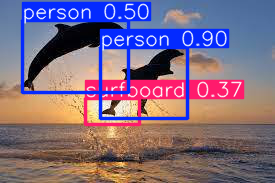

inference output img 2:
image 1/1: 750x750 2 cats, 1 dog
Speed: 9.0ms pre-process, 155.3ms inference, 2.0ms NMS per image at shape (1, 3, 640, 640)
         xmin        ymin        xmax        ymax  confidence  class name
0   11.568600  115.774918  312.757080  667.323730    0.655977     15  cat
1  363.715485  290.178589  750.000000  721.983826    0.509416     16  dog
2  311.190826  102.437492  595.031738  687.870605    0.391701     15  cat


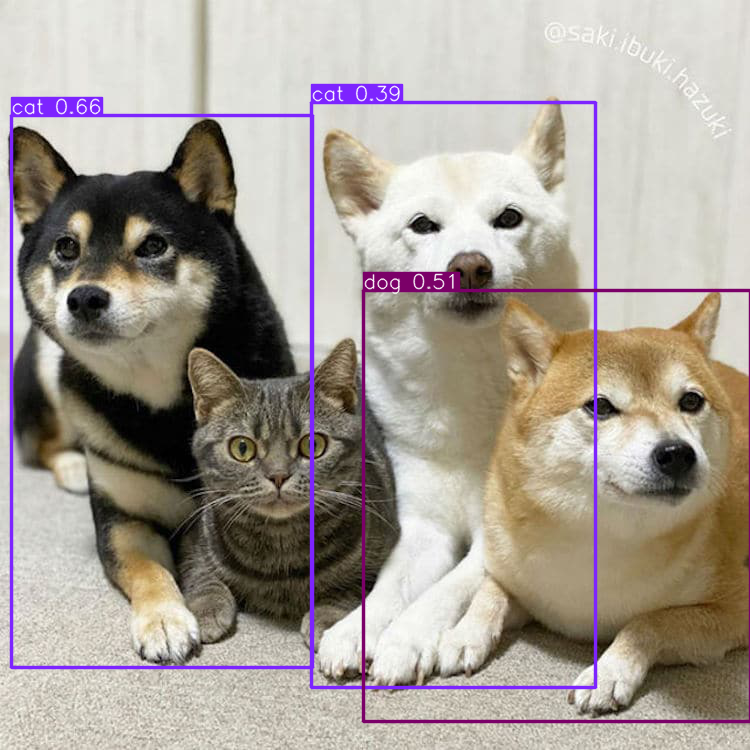

In [24]:
with torch.no_grad():
    #Detecting objects using YOLOv5
    objs_img1 = model(img1)
    objs_img2 = model(img2)

    #Printing inference output1 with bounding boxes
    print('inference output img 1:')
    print(objs_img1)
    print(objs_img1.pandas().xyxy[0])
    objs_img1.show()

    #Printing inference output2 with bounding boxes
    print('inference output img 2:')
    print(objs_img2)
    print(objs_img2.pandas().xyxy[0])
    objs_img2.show()

### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [25]:
#====
from cs236781.answers import display_answer
import hw2.answers
import importlib
importlib.reload(hw2.answers)
#====

display_answer(hw2.answers.part6_q1)


**Your answer:**

**1. Detection Performance and Confidence:**

**Image 1 (DolphinsInTheSky.jpg):** The model detected objects with moderate confidence, but made significant classification errors. Instead of detecting dolphins, it misclassified them as "person" and "surfboard".

**Image 2 (cat-shiba-inu-2.jpg):** The model successfully localized the dogs but completely missed the cat in the image. regardidng the dogs, it had moderate confidence in its detections, which were wrong on 2 out of 3.

**2. Reasons for Failures and Suggested Solutions:**

Possible reasons for the failures:
- **Unseen context:** Dolphins appearing in the sky violate the contextual distributions learned from the training data.
- **Object co-occurrence:** The model might be associating dolphins with people and surfboards due to frequent co-occurrence in the training dataset.
- **Object scale or occlusion:** The cat may be smaller or partially occluded relative to the dog, making detection harder.

Suggested solutions:
- **Training data augmentation:** Add training examples with objects in unusual or unexpected environments so the model will be less sensitive to context.
- **Threshold adjustment:** decrease confidence threshold or use a higher iou threshold for overlapping predictions won't ignore a true object too aggressively.
- **Multi-scale training:** Train the model on images of varying scales to improve detection of small or partially occluded objects.

**3. Adversarial Attacks on YOLO:**

In order to attack YOLO using adversarial attacks similar to PGD we can devise a loss function that targets the different components of YOLO's output (assumming access to the any relevant model information and gradients - white-box attack).
The idea is to utilize gradient ascent to maximize the loss function while constraining the perturbations within a specified norm ball.
$$
\max_{x'} L(x') \quad \text{s.t.} \quad \|x' - x\|_\infty \le \epsilon .
$$

Projected gradient ascent updates the image iteratively as
$$
\tilde{x}^{(k+1)} = x^{(k)} + \alpha \,\mathrm{sign}\!\left(\nabla_x L(x^{(k)})\right),
$$

where $\alpha$ is the step size and the sign function ensures we move in the direction of increasing loss.
$$
x^{(k+1)} = \Pi_{\|x-x^{(0)}\|_\infty \le \epsilon}\!\left(\tilde{x}^{(k+1)}\right).
$$

The gradient ascent step increases the objective Loss, while the projection on the sphere only enforces the perturbation's constraint by collapsing the x (the perturbed image) to the nearest image x (closest point representing closest perturbed image). The projection preserves the ascent direction within the allowed region and therefore does not systematically decrease the loss.

For example, here are 3 types of attacks we can perform, targetting:

**a) Objectness Loss Attack**

**b) Classification Loss Attack**

**c) Bounding Box Loss Attack**



## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.


--- Image 1: imgs/cat-hiding-behind-furniture-green-footage.webp ---
image 1/1: 270x480 1 cat
Speed: 6.5ms pre-process, 116.2ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)
         xmin       ymin        xmax        ymax  confidence  class name
0  227.005325  13.695362  410.105377  267.156464    0.557716     15  cat


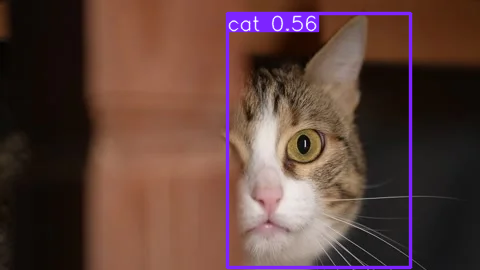


--- Image 2: imgs/camacat.jpg ---
image 1/1: 1280x960 1 cat, 2 dogs, 1 cow, 1 bed
Speed: 27.2ms pre-process, 115.9ms inference, 1.0ms NMS per image at shape (1, 3, 640, 480)
         xmin        ymin        xmax         ymax  confidence  class name
0  370.289429  172.037750  694.778931   359.640900    0.568471     16  dog
1  387.806519  145.207062  937.914795   467.040131    0.451260     19  cow
2   75.008606   77.048538  372.536041   424.786011    0.446372     16  dog
3    4.218506   98.961792  951.584839  1270.715088    0.372389     59  bed
4  106.569336   74.383835  369.304535   434.193848    0.338801     15  cat


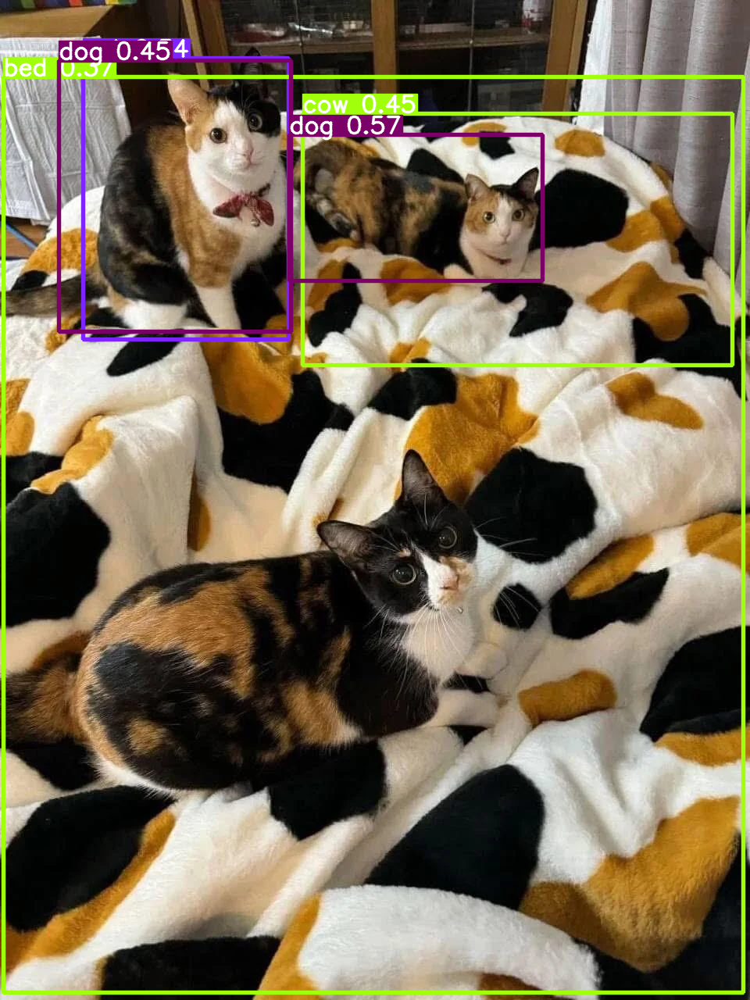


--- Image 3: imgs/blurred.jpg ---
image 1/1: 6240x4160 1 person
Speed: 393.0ms pre-process, 116.8ms inference, 0.0ms NMS per image at shape (1, 3, 640, 448)
         xmin         ymin         xmax         ymax  confidence  class  \
0  1908.86499  2792.480469  3488.785156  5588.228027    0.606664      0   

     name  
0  person  


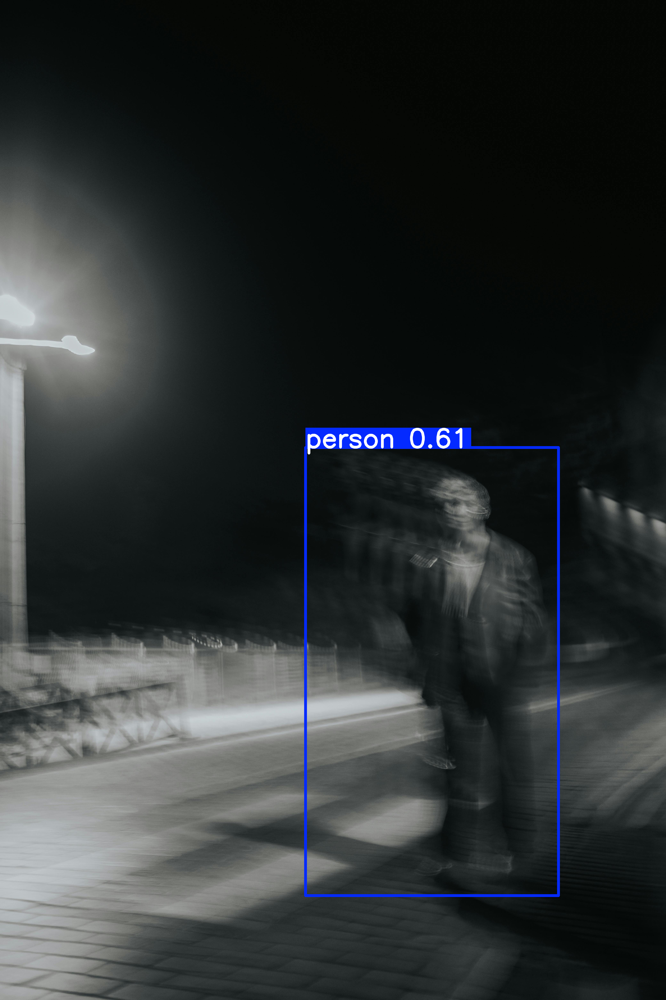

In [26]:
# Detection Pitfall Examples

images = [
    "imgs/cat-hiding-behind-furniture-green-footage.webp",
    "imgs/camacat.jpg",
    "imgs/blurred.jpg"
]

with torch.no_grad():
    for i, img in enumerate(images, 1):
        print(f"\n--- Image {i}: {img} ---")
        objs_img = model(img)
        print(objs_img)
        print(objs_img.pandas().xyxy[0])
        objs_img.show()

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [27]:
display_answer(hw2.answers.part6_q3)



**Your answer:**

**Image 1 - Cat hiding behind a furniture (Occlusion):**
The model detected the cat with moderate confidence, probably because only half of its face is visible. The occlusion likely diminishes key features the model relies on for confident detection.

**Image 2 - Cats on cow-pattern blanket (Textured Background):**
This image is tricky for the model (and for a human it might be so as well hhh). It detected:
- 2 "dogs" (confidence 0.57 and 0.45) - which are actually cats
- 1 "cow" (confidence 0.45) - incorrectly detecting the blanket pattern as a cow
- 1 "bed" (confidence 0.37) - surprisingly detecting the bed correctly but with low confidence (We would also be inconfident about it)
- Only 1 "cat" correctly (confidence 0.34) - with the low confidence (its hidden behind another prediction window)

This image demonstrates how textured/patterned backgrounds can confuse the model.

**Image 3 - Blurred person (Motion Blur):**
The model detected a person with moderate confidence (we could expect the model to do well on the same image without blur). Motion blur degrades detection by eliminating sharp edges and details that CNN feature extraction relies on.



## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

In [28]:
import cv2

#insert bonus code here


In [29]:
display_answer(hw2.answers.part6_bonus)


**Your answer:**

